In [70]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
import argparse
import os
import itertools as it
import math
import shapely

(2173, 1892)


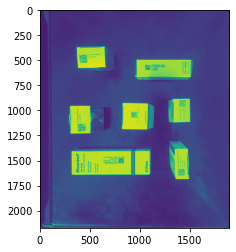

In [84]:
path1 = 'C:/Users/User/Desktop/Box_and_Barcode_Detector/images/easier/plate1.jpg'

image_coloured = cv2.imread(path1)
image = cv2.cvtColor(image_coloured, cv2.COLOR_BGR2GRAY)
image_h, image_w =image.shape
print(image.shape)
plt.imshow(image)

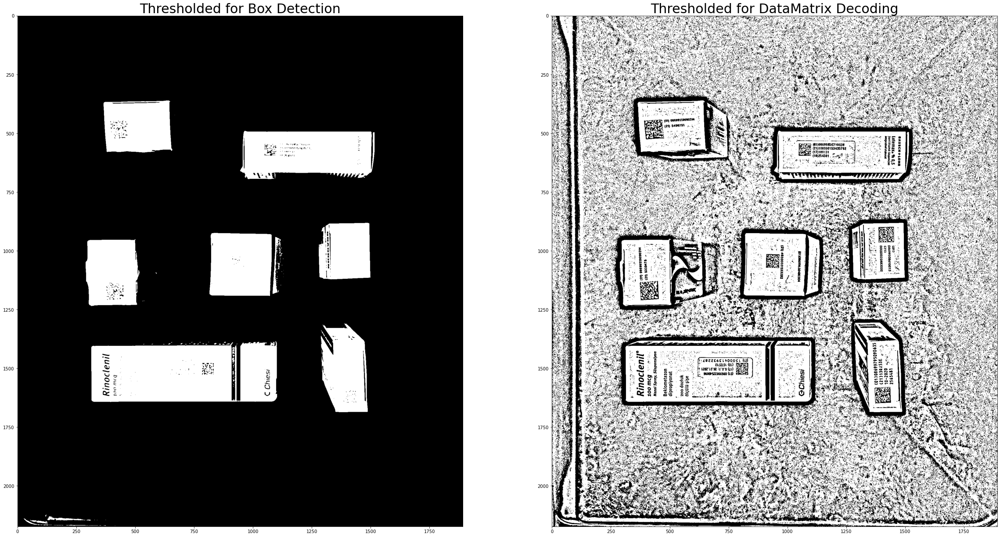

In [85]:

blur = cv2.GaussianBlur(image,(5,5),0)

#Thresholding for box detection
ret3,th3 = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
#Thresholding for DataMatrix decoding
adapt_mean = cv2.adaptiveThreshold(image,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,35,2)

plt.figure(figsize=(40,40))
plt.subplot(1,2,1)
plt.title("Thresholded for Box Detection",fontsize=30)
plt.imshow(th3,'gray')
plt.subplot(1,2,2)
plt.title("Thresholded for DataMatrix Decoding",fontsize=30)
plt.imshow(adapt_mean,'gray')


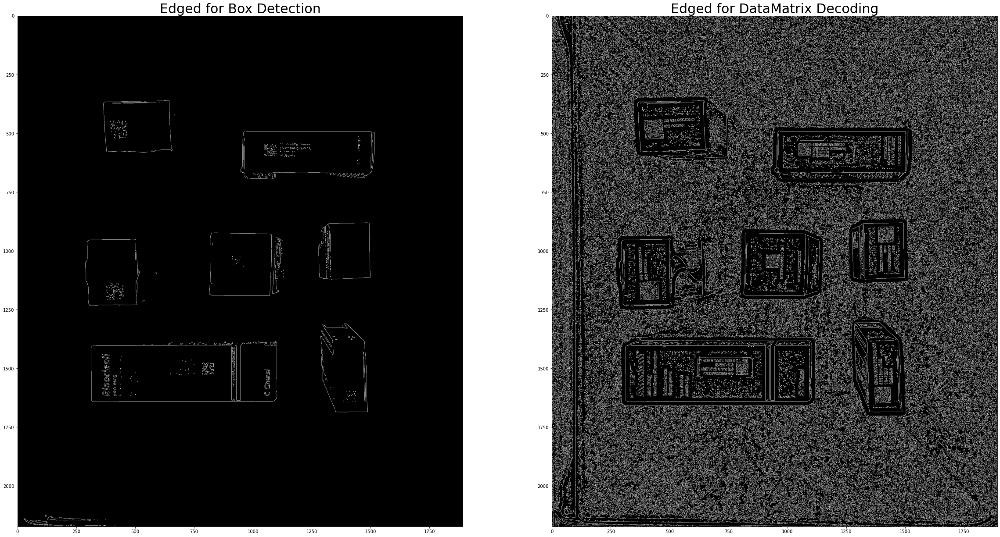

In [86]:

v_1 = np.median(th3)
v_2 = np.median(adapt_mean)
sigma = 0.33

#---- Apply automatic Canny edge detection using the computed median----

lower = int(max(0, (1.0 - sigma) * v_1))
upper = int(min(255, (1.0 + sigma) * v_1))
edged = cv2.Canny(th3, lower, upper)

lower = int(max(0, (1.0 - sigma) * v_2))
upper = int(min(255, (1.0 + sigma) * v_2))
edged_matrix = cv2.Canny(adapt_mean, lower, upper)


plt.figure(figsize=(40,40))
plt.subplot(1,2,1)
plt.title("Edged for Box Detection",fontsize=30)
plt.imshow(edged,'gray')
plt.subplot(1,2,2)
plt.title("Edged for DataMatrix Decoding",fontsize=30)
plt.imshow(edged_matrix,'gray')


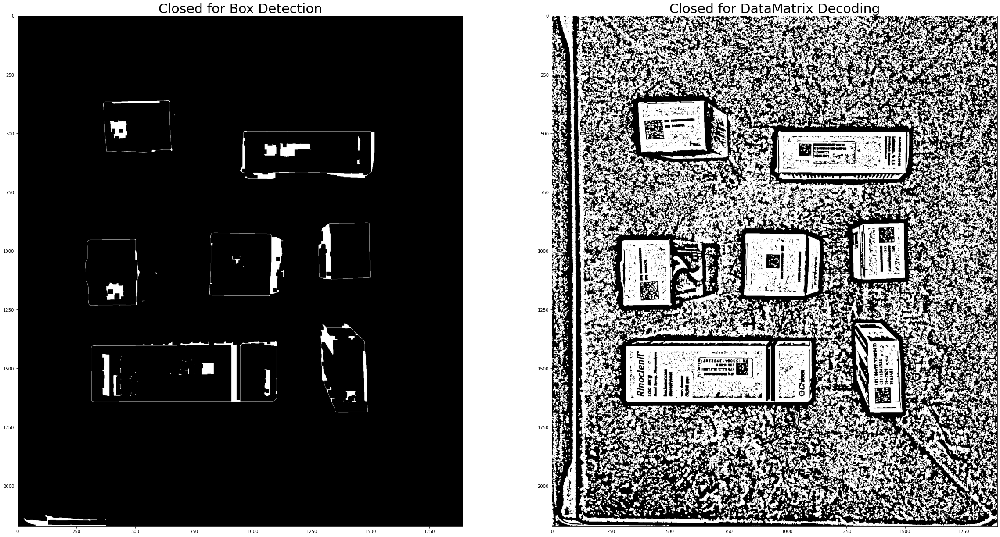

In [87]:
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (15, 15))
closed = cv2.morphologyEx(edged, cv2.MORPH_CLOSE, kernel)

kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (4, 4))
closed_matrix = cv2.morphologyEx(adapt_mean, cv2.MORPH_OPEN, kernel)

plt.figure(figsize=(40,40))
plt.subplot(1,2,1)
plt.title("Closed for Box Detection",fontsize=30)
plt.imshow(closed,'gray')
plt.subplot(1,2,2)
plt.title("Closed for DataMatrix Decoding",fontsize=30)
plt.imshow(closed_matrix,'gray')

In [88]:
contours, hierarchy = cv2.findContours(closed, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

contours_matrix, _ = cv2.findContours(closed_matrix, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

area_threshold = 50*50
min_matrix_size = 10*10
aspect_ratio_threshold = 7
adjacency_threshold = 0.5

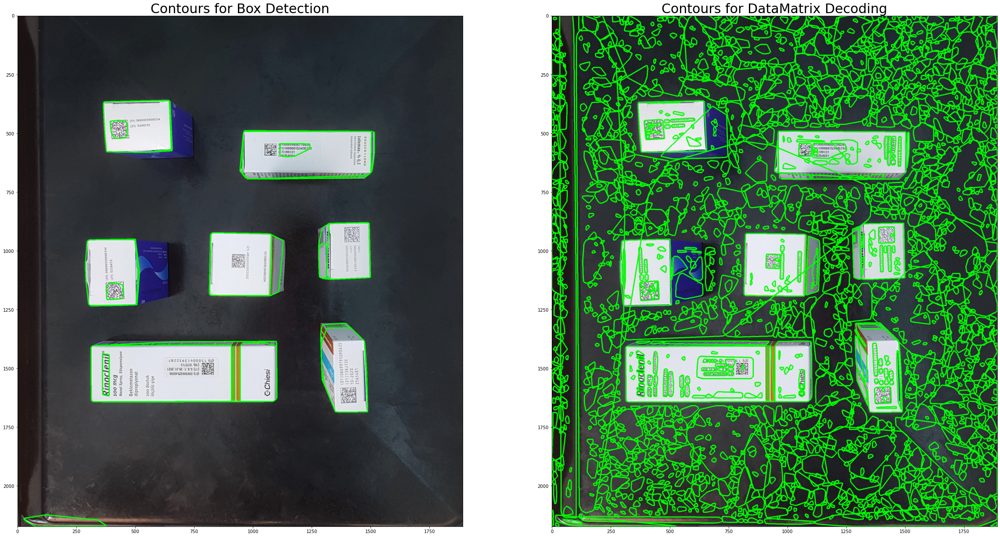

In [89]:
cs = []
cs2=[]
for i in range(len(contours)):
    approx = cv2.convexHull(contours[i])

    if cv2.contourArea(approx)>area_threshold :
            cs.append(approx) 
            
for i in range(len(contours_matrix)):
    approx_2 = cv2.convexHull(contours_matrix[i])

    if cv2.contourArea(approx_2)>10*10:
            cs2.append(approx_2) 


cntim = image_coloured.copy()
cntim = cv2.drawContours(cntim, cs, -1, (0,255,0), 3)

cntim2 = image_coloured.copy()
cntim2 = cv2.drawContours(cntim2, cs2, -1, (0,255,0), 3)

plt.figure(figsize=(40,40))
plt.subplot(1,2,1)
plt.title("Contours for Box Detection",fontsize=30)
plt.imshow(cntim,'gray')
plt.subplot(1,2,2)
plt.title("Contours for DataMatrix Decoding",fontsize=30)
plt.imshow(cntim2,'gray')

## Box Detection

In [90]:
from shapely.geometry import Polygon,box

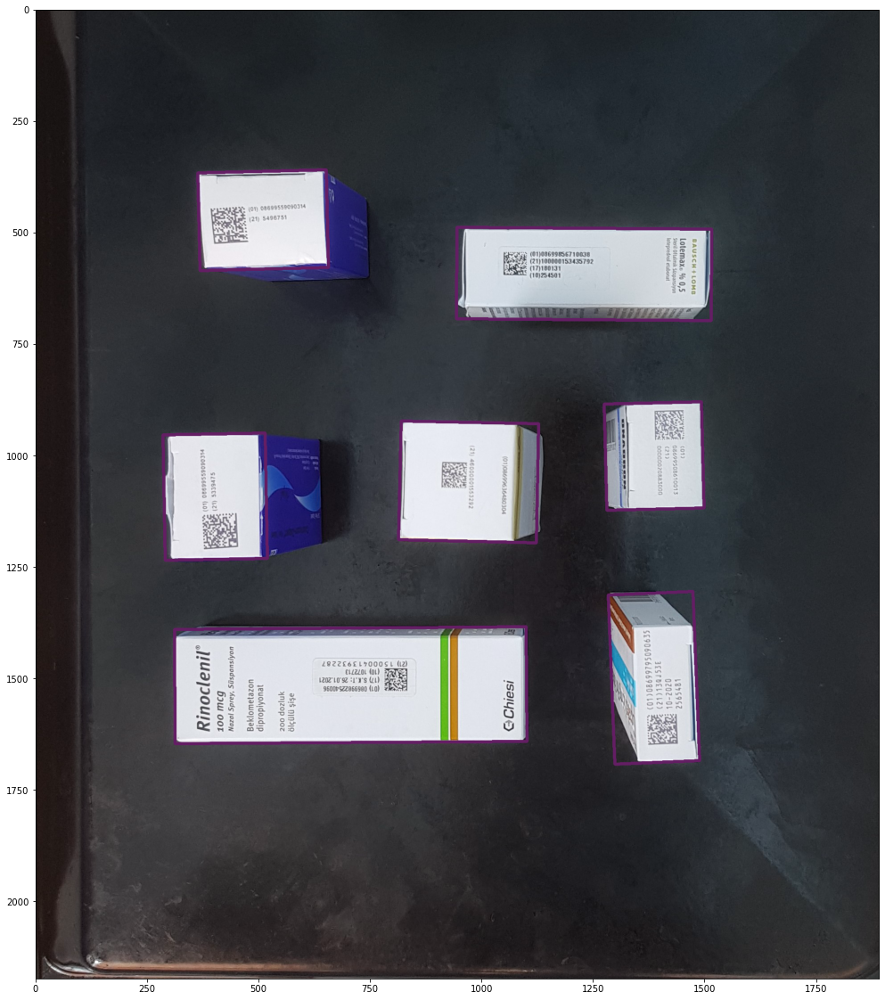

In [91]:
rects = []
boxes = []


for i in range(len(contours)):
    approx = cv2.convexHull(contours[i])
    
    contArea = cv2.contourArea(approx)
    
    #AREA THRESHOLD
    if contArea > area_threshold :
        
        rect = cv2.minAreaRect(approx)
        (x1,y1),(w1,h1),_ = rect
        
        rectArea = w1*h1
        
        #ASPECT RATIO MEASUREMENT
        aspect_ratio = w1/h1
        
        if 1/aspect_ratio_threshold < aspect_ratio < aspect_ratio_threshold :
            
            #SHAPE INTERACTIONS----------------------------------------------------------------------------------- 

            box = cv2.boxPoints(rect)
            box = np.int0(box) 
            boxPoly1 = Polygon(box)
            
            addRect = True
            
            j=0
            while j < len(rects):
                (x2,y2),(w2,h2),_ = rects[j]

                boxPoly2 = Polygon(boxes[j])
                
                #CHECK FOR DUPLICATES AND SHAPES AT EDGES OF FRAME
                if boxPoly1.almost_equals(boxPoly2, decimal=0) or boxPoly1.equals(boxPoly2) \
                or not boxPoly1.within(Polygon([(1,1),(1,image_h-2),(image_w-2,image_h-2),(image_w-2,1)])):
                    addRect = False
                    break     
                
                #FIND SHAPES CONTAINED IN SHAPES
                elif boxPoly1.contains(boxPoly2):
                    del rects[j]
                    del boxes[j]                        
                elif boxPoly1.within(boxPoly2):
                    addRect = False
                    break
                
                #FIND SHAPES CROSSING, TOUCHING OR IN CLOSE PROXIMITY (DETERMINED BY THRESHOLD)
                elif boxPoly1.crosses(boxPoly2) \
                or boxPoly1.touches(boxPoly2) \
                or boxPoly1.distance(boxPoly2) < min(w1,h1,w2,h2)*adjacency_threshold :

                    rectArea2 = w2*h2
                   
                    if rectArea <= rectArea2:       
                        addRect = False
                        break 
                    else:    
                        del rects[j]
                        del boxes[j]
                else: 
                    #print("distance/min(w1,h1,w2,h2) : ",boxPoly1.distance(boxPoly2)/min(w1,h1,w2,h2))
                    j+=1
                                          
            if addRect:
                rects.append(rect)
                boxes.append(box)
                #print("RECT: ",rect)

rect_img = image_coloured.copy()


cv2.drawContours(rect_img, boxes, -1, (100,30,100), 5) 
    

plt.figure(figsize=(20,20))

plt.imshow(rect_img)



#cv2.imwrite('C:/Users/User/Desktop/barcode_proj/images/results/white_background3.jpg',contoured)




## To Remove Duplicated DataMatrices

In [92]:
def removeDuplicates(boxes):
    i=0
    while i < len(boxes):
        points1 = cv2.boxPoints(boxes[i])
        points1 = np.int0(points1) 
        poly1 = Polygon(points1)

        j = i+1
        while j < len(boxes):
            
            points2 = cv2.boxPoints(boxes[j])
            points2 = np.int0(box2) 
            poly2 = Polygon( points2 )
            if poly1.equals(poly2) or poly1.almost_equals(poly2, decimal=-1):
                del boxes[j]
                print("removed")
            else: j += 1
        i +=1
    return boxes

## DataMatrix Detection Method - 1

In [93]:
from pylibdmtx.pylibdmtx import decode

In [94]:
min_matrix_size = 10*10
irregularity_threshold = 0.1
aspect_margin = 0.1
boxMargin = 0.5

def findMatrices(boxImage):
    matrix_rotated = []
    matrix_contours, _= cv2.findContours(boxImage, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    
    for contour in  matrix_contours:
        contour = cv2.convexHull(contour) 
        contArea = cv2.contourArea(contour)
    
        #AREA THRESHOLD
        if  boxMargin*boxImage.size >contArea > min_matrix_size :
        
            #IRREGULARITY (NON-RECTANGULARITY) MEASUREMENT
            irregularity = 0
            aspect_ratio = 0
    
            rect = cv2.minAreaRect(contour)
            (x1,y1),(w1,h1),_ = rect
        
            rectArea = w1*h1

            irregularity = abs(rectArea-contArea)/rectArea
        
            #ASPECT RATIO MEASUREMENT
            aspect_ratio = w1/h1
        
            if irregularity < irregularity_threshold and 1-aspect_margin < aspect_ratio < 1+aspect_margin :
                matrix_rotated.append(rect)
    
    matrix_rotated = removeDuplicates(matrix_rotated)   
    print(len(matrix_rotated))

    return matrix_rotated
         

0
2
decoded:  b'01086997950906352113QJ53E17201010102565481'
bounding rect:  1283 1305 206 388
1
decoded:  b'0108699559090314215339475\x1d171902281016011'
bounding rect:  285 950 235 286
1
1
decoded:  b'010869950861001321000000208830001717063010406021'
bounding rect:  1274 880 225 244
1
decoded:  b'0108699856710038211000001534357921718013110254501'
bounding rect:  943 489 573 210
1
decoded:  b'0108699559090314215496751\x1d171902281016010'
bounding rect:  363 360 294 227


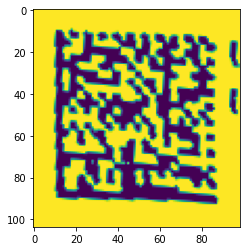

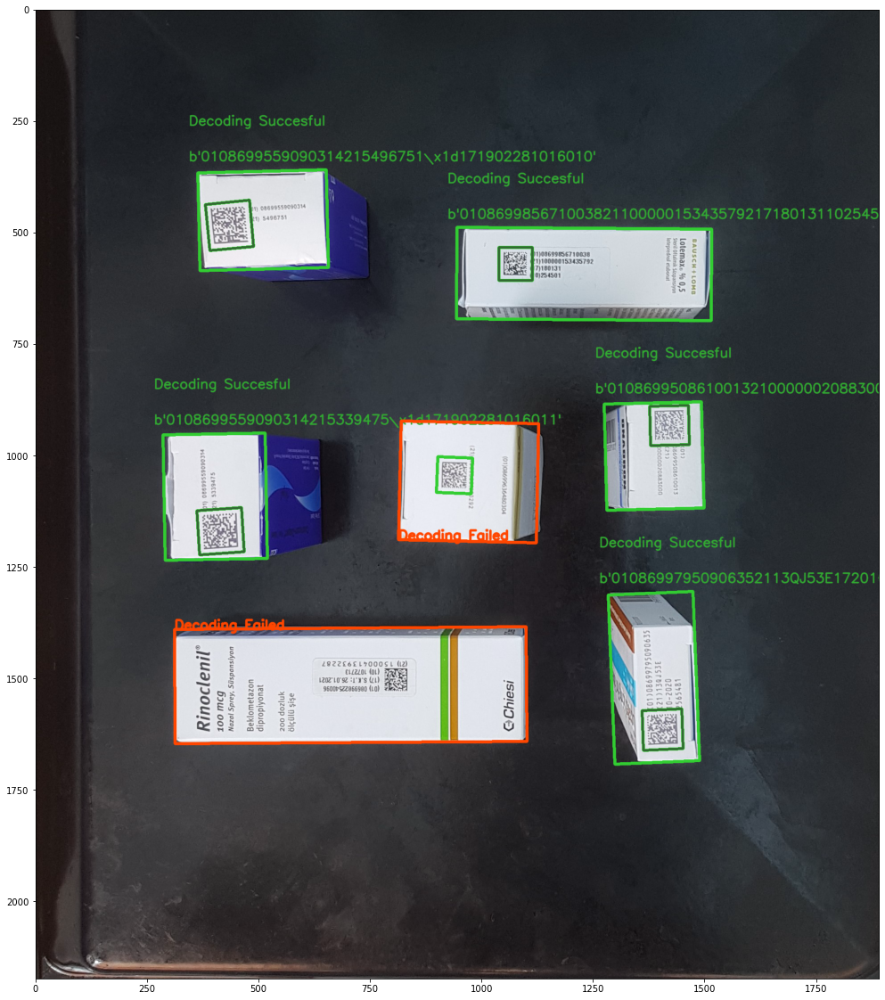

In [95]:
rect_img = image_coloured.copy()
font = cv2.FONT_HERSHEY_SIMPLEX
margin = 20

for box in boxes:
    result = []
    x,y,w,h = cv2.boundingRect(box)
    decoded_box = []
    
    matrix_boxes=findMatrices( closed_matrix[y:y+h,x:x+w])
    
    #we use the adaptive thresholded image for increased decoding accuracy
    for mat_box in matrix_boxes:     

        w2 = int(mat_box[1][0]) + margin
        h2 = int(mat_box[1][1]) + margin
        
        mat_box = ((mat_box[0][0]+x,mat_box[0][1]+y),( w2, h2 ),mat_box[2])
        
        box2 = np.int0( cv2.boxPoints(mat_box) )
        cv2.drawContours(rect_img, [box2], -1, (50,205,50), 5) 

        straight_box = np.array([[0, h2-1], [0, 0],[w2-1, 0], [w2-1, h2-1]], dtype="float32")

        #perspective transformation matrix
        transform = cv2.getPerspectiveTransform( box2.astype("float32"), straight_box)

        # warp the rotated rectangle 
        warped = cv2.warpPerspective(adapt_mean, transform, (w2, h2))
        plt.imshow(warped)
        
        temp_result = decode(  warped )
        
        if len(temp_result):           
            result = temp_result[0]            
            break
    
    if not len(result):
        cv2.drawContours(rect_img, [box], -1, (255,70,0), 5) 
        cv2.putText(rect_img,'Decoding Failed',(box[1][0],box[1][1]), font, 1, (255,70,0), 3, cv2.LINE_AA)
    
    else:
        print("decoded: ", result.data)
        #print("coor:  ",x2,y2,w2,h2)
        print("bounding rect: ",x,y,w,h)
        
        cv2.drawContours(rect_img, [box2], -1,(50,105,50),4)
        
        cv2.putText(rect_img,'Decoding Succesful',(x-margin,y-margin*5), font, 1, (50,170,50), 2, cv2.LINE_AA)
        cv2.putText(rect_img, str(result.data) ,(x-margin,y-margin), font, 1, (50,170,50), 2, cv2.LINE_AA)
        
        cv2.drawContours(rect_img, [box], -1, (50,205,50), 5)    

plt.figure(figsize=(20,20))

plt.imshow(rect_img)


#cv2.imwrite('C:/Users/User/Desktop/results/turned270.jpg',rect_img)